# YallaMotors Cars Dataset (continue)

In the previous Jupyter notebook, we performed data wrangling and basic feature engineering on the YallaMotors Cars Dataset after cleaning and wrangling it. Now, we can utilize the dataset for further analysis and gain more insights into the cars' characteristics, pricing, classification, etc.

The dataset contains information about various cars, including their specifications, brand, country of origin, currency, and price. It has undergone a cleaning process where missing values were dropped, data types were adjusted, and duplicates were handled.

# Introduction:

The aim of this study is to delve into the YallaMotors Cars Dataset, an extensive collection of car specifications and pricing information, in order to gain valuable insights and uncover predictive patterns. By performing exploratory analysis and employing regression models, we seek to understand the relationships between various car features and their impact on the price of vehicles. Additionally, we aim to identify the most influential factors in determining car prices and explore the distribution of car brands and countries represented in the dataset. This comprehensive analysis will provide a deeper understanding of the dataset and enable informed decision-making for car buyers, sellers, and enthusiasts.

# Goals:

* Explore the dataset: We will begin by loading and examining the YallaMotors Cars Dataset, gaining familiarity with its structure and variables.

* Visualize car specifications: Through the creation of histograms, we will gain insights into the distribution of car specifications such as engine capacity, number of cylinders, horsepower, top speed, and seating capacity. These visualizations will provide an overview of the dataset and highlight any notable patterns or outliers.

* Investigate correlations: By computing a correlation matrix and visualizing it as a heatmap, we will determine the relationships between car specifications and the price of vehicles. This analysis will help identify which features have a strong impact on pricing.

* Analyze scatter plots: Through scatter plots, we will examine the relationships between individual car specifications and the price of vehicles. This will allow us to visually observe any linear or non-linear trends and understand the nature of the relationships.

* Regression modeling: We will employ various regression techniques, including simple linear regression, polynomial regression, and multiple linear regression, to model the relationship between car specifications and price. These models will provide predictive capabilities and assist in understanding how changes in car features influence the price.

* Brand and country analysis: By visualizing the distribution of car brands and countries, we will identify the most common brands and the countries that are well-represented in the dataset. This analysis will provide insights into market trends and preferences.

* Standardized price analysis: By examining the mean price for each car brand, we will gain an understanding of the average price range associated with different brands. This analysis will help assess the positioning of brands in terms of pricing.

* Price category prediction: By categorizing car prices into different segments (e.g., 'Affordable', 'Expensive', 'Luxury'), we will train a logistic regression model to predict the price category based on car specifications. This predictive analysis will aid in classifying cars into different price brackets.

Through this comprehensive analysis of the YallaMotors Cars Dataset, we aim to provide valuable insights into the factors influencing car prices, identify market trends, and enable data-driven decision-making for car buyers, sellers, and industry professionals.

In [1]:
#import libraries
import pandas as pd
import numpy as np
import altair as alt
from sklearn.linear_model import LinearRegression, LogisticRegression, Ridge
from sklearn.preprocessing import PolynomialFeatures, StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier, GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.metrics import mean_squared_error, r2_score, accuracy_score, roc_curve, auc, confusion_matrix
from sklearn.model_selection import GridSearchCV, cross_val_score
import matplotlib.pyplot as plt
from IPython.display import display
import warnings
warnings.filterwarnings("ignore")

Firstly, load the car dataset from the 'wrangled_cars.csv' file into a DataFrame. This dataset should contain relevant information about cars, including their prices in USD.

Next, set two specific thresholds to classify car prices. One threshold represents the upper limit for the "Expensive" category, while the other represents the upper limit for the "Affordable" category.

Create a new column, 'price_category', in the DataFrame. This column will serve as a way to categorize each car based on its price. Utilize the pd.cut() function to accomplish this task. Provide the 'price_USD' column as the input and specify the price bins for different categories. Assign appropriate labels to the corresponding bins.

Finally, display the updated DataFrame, which now includes the 'price_category' column. This will allow us to observe the dataset with the newly assigned price categories for each car. The 'price_category' column will aid in identifying the price category to which each car belongs, simplifying subsequent analysis and classification tasks.

In [2]:
# Load the dataset
df = pd.read_csv('wrangled_cars.csv', index_col=False)

# Assign thresholds for classification
expensive_threshold = 100000
affordable_threshold = 50000

# Create a new column for the price categories
df['price_category'] = pd.cut(df['price_USD'], bins=[0, affordable_threshold, expensive_threshold, float('inf')], labels=['Affordable', 'Expensive', 'Luxury'])
df

,car name,engine_capacity,cylinder,horse_power,top_speed,seats,brand,country,currency,price_currency,price_USD,price_category
0,Suzuki Jimny 2021 1.5L Automatic,1.5,4.0,102.0,145.0,4.0,suzuki,ksa,SAR,98785.0,26671.95,Affordable
1,Honda HR-V 2021 1.8 i-VTEC EX,1.8,4.0,140.0,190.0,5.0,honda,ksa,SAR,95335.0,25740.45,Affordable
2,Renault Koleos 2021 2.5L LE (4WD),2.5,4.0,170.0,199.0,5.0,renault,ksa,SAR,116900.0,31563.00,Affordable
3,Suzuki Jimny 2021 1.5L M/T,1.5,4.0,102.0,145.0,4.0,suzuki,ksa,SAR,91885.0,24808.95,Affordable
4,Honda HR-V 2021 1.8 i-VTEC DX,1.8,4.0,140.0,190.0,5.0,honda,ksa,SAR,72335.0,19530.45,Affordable
...,...,...,...,...,...,...,...,...,...,...,...,...
3980,Aston Martin DB11 2021 4.0T V8 Volante,4.0,8.0,503.0,322.0,4.0,aston-martin,uae,AED,945384.0,255253.68,Luxury
3981,BMW M8 Convertible 2021 4.4T V8 Competition xD...,4.4,8.0,625.0,250.0,4.0,bmw,uae,AED,930300.0,251181.00,Luxury
3982,Mercedes-Benz S Class Cabriolet 2021 S 65,6.0,12.0,630.0,250.0,4.0,mercedes-benz,uae,AED,980000.0,264600.00,Luxury
3983,BMW M8 Coupe 2021 4.4T V8 Competition xDrive (...,4.4,8.0,625.0,250.0,4.0,bmw,uae,AED,905900.0,244593.00,Luxury


# Exploratory Data Analysis

Engine Capacity:
The histogram of engine capacity provides a visual representation of the distribution of different engine capacities among the cars in the dataset. By analyzing the histogram, we can gain insights into the range and frequency of engine capacities present in the dataset. This information helps us identify the most common engine capacity ranges and any notable outliers with significantly larger or smaller engine capacities. Understanding the diversity of engine sizes enables us to grasp the typical engine capacities exhibited by the cars in the dataset.

Cylinder:
The histogram depicting the number of cylinders in the cars showcases the distribution of cylinder counts across the dataset. Examining this histogram allows us to discern the frequency of different cylinder configurations and their representation in the dataset. By analyzing the histogram, we can identify the predominant cylinder counts, detect any discernible patterns or clusters, and draw insights into the engine performance and characteristics exhibited by the cars. This information provides a deeper understanding of the prevalent engine types based on cylinder count.

Horsepower:
The histogram representing horsepower values reveals the distribution of horsepower across the cars in the dataset. This visualization enables us to grasp the range and frequency of horsepower values present in the dataset. By studying the histogram, we can identify the most common horsepower ranges and identify any exceptional cases with extremely high or low horsepower values. This information offers insights into the power and performance characteristics of the cars, allowing us to distinguish between cars with higher or lower horsepower relative to the majority.

Top Speed:
The histogram illustrating the distribution of top speeds among the cars provides insights into the range and frequency of top speed values in the dataset. Analyzing this histogram allows us to identify the prevailing top speed ranges and observe any outliers with remarkably high or low speeds. By doing so, we gain insights into the speed capabilities of the cars and can distinguish between cars designed for higher or lower speeds compared to the majority. This information contributes to understanding the performance attributes of the cars in terms of their top speed capabilities.

Seats:
The histogram showcasing the distribution of seat counts among the cars helps us understand the range and frequency of seating capacities present in the dataset. By examining this histogram, we can identify the most common seat count ranges, observe any noticeable patterns or clusters, and gain insights into the typical seating arrangements provided by the cars. This information allows us to comprehend the range of passenger capacities offered by the cars and understand the variation in seating options available.

In [3]:
# Generate histograms for car specifications
specifications = ['engine_capacity', 'cylinder', 'horse_power', 'top_speed', 'seats']

for spec in specifications:
    alt.Chart(df).mark_bar().encode(
        alt.X(spec, bin=alt.Bin(maxbins=20)),
        alt.Y('count()'),
        color=alt.Color(f'{spec}:Q',scale=alt.Scale(scheme='viridis')),
    ).properties(
        title=f'Distribution of {spec}',
        width=700,
        height=300
    ).interactive().display()

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

The presence of a normal distribution, or a slightly distorted bell-shaped distribution, in the histograms of horsepower and engine capacity can provide several insights:

* Central Tendency: The peak or center of the distribution represents the most common or typical values for horsepower and engine capacity. The highest point of the bell-shaped curve indicates the mode, which represents the most frequently occurring values.

* Average Values: The mean or median of the distribution can provide an estimate of the average horsepower and engine capacity values in the dataset. These measures of central tendency can help identify the typical power and capacity levels of the cars.

* Range of Values: The spread or width of the distribution provides insights into the range of horsepower and engine capacity values present in the dataset. A wider distribution indicates a broader range of values, suggesting greater variation among the cars in terms of their power and capacity.

* Outliers: Any values that deviate significantly from the main body of the distribution (i.e., the tails of the curve) may represent outliers. These outliers could indicate cars with exceptionally high or low horsepower and engine capacity values that are relatively rare in the dataset.

* Normality Assumption: The presence of a normal or bell-shaped distribution suggests that the majority of cars exhibit horsepower and engine capacity values close to the mean or median. This assumption can be useful when applying statistical techniques that rely on normality, such as hypothesis testing or regression analysis.

* Comparison: By comparing the distributions of horsepower and engine capacity, we can determine if there is a correlation or relationship between these two variables. For example, a higher horsepower value might be associated with a larger engine capacity.

Correlation Matrix: The code calculates the correlation matrix using the corr() function on a subset of columns from the DataFrame (df). The selected columns include 'engine_capacity', 'cylinder', 'horse_power', 'top_speed', 'seats', and 'price_USD'. The correlation matrix quantifies the relationships between these variables, indicating how they are related to each other in terms of their linear association.

Heatmap: The correlation matrix is then reshaped using the melt() function from pandas, which transforms the matrix into a tidy format suitable for visualization. The melted data is used to create a heatmap using the mark_rect() function in Altair. The heatmap represents the correlations as a grid of colored rectangles, where each rectangle corresponds to the correlation between two variables. The color intensity represents the strength and direction of the correlation.

For many plots in this dataset I've used Altair library. There are several advantages for creating visualizations with Altair:

Concise Syntax: Altair provides a high-level, declarative syntax that allows for the creation of complex visualizations with minimal code.
Interactive Features: Altair supports interactivity, such as tooltips, which enhance the exploration and understanding of the data.
Vega-Lite Backend: Altair is built on top of the Vega-Lite visualization grammar, which enables the generation of highly customizable, interactive visualizations.
Integration with Pandas: Altair seamlessly integrates with pandas, allowing for easy data manipulation and visualization within the same workflow.
By leveraging Altair's capabilities, the code produces an informative and visually appealing correlation matrix heatmap, enabling the identification of relationships and patterns among the selected variables.

In [4]:
#Correlation Matrix and Heatmap

corr_matrix = df[['engine_capacity', 'cylinder', 'horse_power', 'top_speed', 'seats', 'price_USD']].corr().reset_index().rename(columns={'index': 'variable_1'})
corr_data = pd.melt(corr_matrix, id_vars='variable_1', var_name='variable_2', value_name='correlation')

# Create the heatmap chart
chart = alt.Chart(corr_data).mark_rect().encode(
    alt.X('variable_1:N', title=None, axis=alt.Axis(labelAngle= 0, labelFontSize=14, labelColor='white')),
    alt.Y('variable_2:N', title=None, axis=alt.Axis(labelAngle= -90, labelFontSize=14, labelColor='white')),
    color=alt.Color('correlation:Q', title='Correlation',
                    legend=alt.Legend(gradientThickness=75, gradientLength=550, padding=50, labelFontSize=14, labelColor='white', titleFontSize=14, titleColor='white')),
    tooltip=['variable_1', 'variable_2', 'correlation'],

).properties(
    width=700,
    height=700,
    title=alt.TitleParams(text='Correlation Matrix Heatmap', color='white')
)

text = chart.mark_text(baseline='middle', fontSize=22).encode(
    text=alt.Text('correlation:Q', format='.2f'),
    color=alt.condition(
        alt.datum.correlation > 0.65,
        alt.value('white'),
        alt.value('grey')
    )
)

# Display the chart
(chart + text).configure(background='transparent').display()

alt.LayerChart(...)

The heatmap provides insights into the relationships between the variables in the dataset. Here are some observations and insights based on the correlation values:

1. Engine Capacity:
Strong positive correlation with Cylinder (0.912077): This indicates that cars with larger engine capacities tend to have more cylinders.
Moderate positive correlation with Horsepower (0.803584): It suggests that cars with larger engine capacities tend to have higher horsepower.
Weak positive correlation with Top Speed (0.448250): There is a slight tendency for cars with larger engine capacities to have higher top speeds.
Weak positive correlation with Price (0.588194): Cars with larger engine capacities may have slightly higher prices.

2. Cylinder:
Strong positive correlation with Engine Capacity (0.912077): This suggests that cars with more cylinders tend to have larger engine capacities.
Moderate positive correlation with Horsepower (0.856948): Cars with more cylinders generally have higher horsepower.
Weak positive correlation with Top Speed (0.558915): There is a slight tendency for cars with more cylinders to have higher top speeds.
Weak positive correlation with Price (0.724487): Cars with more cylinders may have slightly higher prices.

3. Horsepower:
Strong positive correlation with Engine Capacity (0.803584): Cars with higher horsepower tend to have larger engine capacities.
Moderate positive correlation with Cylinder (0.856948): Cars with higher horsepower typically have more cylinders.
Moderate positive correlation with Top Speed (0.778112): Cars with higher horsepower tend to have higher top speeds.
Moderate positive correlation with Price (0.805757): Cars with higher horsepower are often associated with higher prices.

4. Top Speed:
Moderate positive correlation with Horsepower (0.778112): Cars with higher top speeds tend to have higher horsepower.
Moderate negative correlation with Seats (-0.441546): Cars with higher top speeds often have fewer seats.
Weak positive correlation with Engine Capacity (0.448250): There is a slight tendency for cars with higher top speeds to have larger engine capacities.
Weak positive correlation with Price (0.693025): Cars with higher top speeds may have slightly higher prices.

5. Seats:
Weak negative correlation with Top Speed (-0.441546): Cars with more seats tend to have lower top speeds.
Weak negative correlation with Price (-0.257167): Cars with more seats may have slightly lower prices.

6. Price:
Moderate positive correlation with Cylinder (0.724487), Horsepower (0.805757), and Engine Capacity (0.588194): Cars with higher prices typically have more cylinders, higher horsepower, and larger engine capacities.
Weak positive correlation with Top Speed (0.693025): Cars with higher prices may have slightly higher top speeds.
Weak negative correlation with Seats (-0.257167): Cars with higher prices may have slightly fewer seats.

These insights provide a glimpse into the relationships between the car specifications and price. However, it's important to note that correlation does not imply causation, and further analysis and domain knowledge are necessary to draw definitive conclusions.

Let's see scatter plots that depict the relationship between various car specifications and the price of the cars in the dataset. Each scatter plot represents a specific car specification plotted against the price in US dollars.

Engine Capacity vs. Price_USD:
The scatter plot showcases the relationship between engine capacity and the price of the cars. It allows us to observe how the engine capacity of a car influences its price. By examining the scatter plot, we can identify any patterns or trends between the two variables. This information provides insights into the pricing dynamics based on the engine capacity of the cars.

Cylinder vs. Price_USD:
The scatter plot represents the correlation between the number of cylinders in a car and its price. It enables us to understand how the cylinder count affects the price of the cars in the dataset. By analyzing the scatter plot, we can identify any associations or patterns between the two variables. This information helps us gain insights into the pricing variations based on the cylinder configurations.

Horsepower vs. Price_USD:
The scatter plot illustrates the relationship between the horsepower of a car and its price. It allows us to examine how the power output of the engine influences the pricing of the cars. By studying the scatter plot, we can identify any correlations or trends between the two variables. This information provides insights into the pricing dynamics based on the horsepower of the cars.

Top Speed vs. Price_USD:
The scatter plot displays the correlation between the top speed of a car and its price. It enables us to understand how the maximum speed capability impacts the pricing of the cars in the dataset. By analyzing the scatter plot, we can identify any connections or patterns between the two variables. This information helps us gain insights into the pricing variations based on the top speed of the cars.

Seats vs. Price_USD:
The scatter plot represents the relationship between the number of seats in a car and its price. It allows us to examine how the seating capacity influences the pricing of the cars. By studying the scatter plot, we can identify any associations or trends between the two variables. This information provides insights into the pricing dynamics based on the seating arrangements of the cars.

The scatter plots provide visual representations of the relationships between car specifications and their corresponding prices, allowing us to identify any discernible patterns or correlations. By examining these plots, we can gain insights into the factors influencing the pricing of the cars in the dataset.

In [5]:
# Generate scatter plots of car specifications vs. price
for spec in specifications:
    alt.Chart(df).mark_circle().encode(
        alt.X(spec),
        alt.Y('price_USD'),
        color=alt.Color(f'{spec}:Q',scale=alt.Scale(scheme='magma')),
        tooltip=[spec, 'price_USD'],
    ).properties(
        title=f'{spec} vs. Price_USD',
        width=700,
        height=300
    ).interactive().display()

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

alt.Chart(...)

# Prediction problem

After observing the scatter plots of price versus horsepower and engine capacity, we can indeed notice a notable correlation between these variables. This correlation suggests that both horsepower and engine capacity have a significant impact on the price of a car. Based on these insights, we can proceed with performing various types of regression analyses to model and predict the relationship between price and the car specifications.

Linear Regression:
Linear regression is a statistical technique used to model the linear relationship between a dependent variable (price) and one or more independent variables (such as horsepower or engine capacity). In the case of simple linear regression, we would use either horsepower or engine capacity as the predictor variable to estimate the price. Multiple linear regression involves using both horsepower and engine capacity as predictors simultaneously to predict the price. The linear regression model aims to find the best-fitting line that minimizes the difference between the predicted and actual prices.

Polynomial Regression:
Polynomial regression extends the linear regression model by including polynomial terms of the predictor variables (horsepower and/or engine capacity). This allows for capturing nonlinear relationships between the variables. By introducing polynomial terms, such as quadratic or cubic terms, the model can better fit curved patterns in the data. Polynomial regression can be useful if there is evidence of nonlinear relationships between the car specifications and price in the scatter plots.

Multilinear Regression:
Multilinear regression, also known as multiple regression, involves modeling the relationship between price and multiple predictor variables simultaneously. In this case, we would consider horsepower, engine capacity, and potentially other relevant car specifications (such as top speed or number of seats) as predictors of price. The multilinear regression model estimates the coefficients for each predictor variable, allowing us to assess the individual and combined effects of these variables on the price.

By employing these regression techniques, we can create mathematical models that quantify the relationship between price and the car specifications. These models can be used for predicting the price of new cars based on their horsepower, engine capacity, and other relevant factors. The choice of regression approach will depend on the nature of the relationship observed in the scatter plots and the complexity of the underlying patterns in the data.

In [6]:
# Perform simple linear regression
X = df[['horse_power']]
y = df['price_USD']

model = LinearRegression()
model.fit(X, y)

# Predict the target variable
y_pred = model.predict(X)

# Calculate mean squared error (MSE)
mse = mean_squared_error(y, y_pred)

# Calculate R^2 score
r2 = r2_score(y, y_pred)

# Print the MSE and R^2 score
print("Mean Squared Error (MSE):", mse)
print("R^2 Score:", r2)

Mean Squared Error (MSE): 1479947062.8348782
R^2 Score: 0.6492442581183876


The mean squared error measures the average squared difference between the predicted prices and the actual prices. In this case, the MSE is approximately 1,479,947,062.83. A lower MSE indicates that the model has a smaller average prediction error, suggesting a better fit to the data.

The R^2 score, also known as the coefficient of determination, represents the proportion of variance in the target variable (price_USD) that can be explained by the predictor variable (horse_power). In this case, the R^2 score is approximately 0.65, which means that around 65% of the variance in the price can be explained by the horsepower. A higher R^2 score indicates a better fit of the model to the data, suggesting that the horsepower is a moderately good predictor of the price.

Overall, these results indicate that the 'horse_power' variable has a moderate relationship with the 'price_USD', as evidenced by the MSE and R^2 score. However, it's important to note that a single predictor variable may not capture the full complexity of the relationship between the variables, and there may be other factors influencing the price that are not accounted for in this simple linear regression model.

In [7]:
# Visualize the linear regression line
x_vals = np.linspace(X['horse_power'].min(), X['horse_power'].max(), 100)
y_vals = model.predict(x_vals[:, np.newaxis])

scatter = alt.Chart(df).mark_circle().encode(
    alt.X('horse_power'),
    alt.Y('price_USD'),
    tooltip=['horse_power', 'price_USD']
).properties(
    width=700,
    height=300,
    title=alt.TitleParams(text='Scatter plot', color='white'),
).interactive()

line = alt.Chart(pd.DataFrame({'horse_power': x_vals, 'price_USD': y_vals})).mark_line(color='red').encode(
    alt.X('horse_power'),
    alt.Y('price_USD')
)

(scatter + line).interactive().display()

alt.LayerChart(...)

We have performed a simple linear regression using the 'horse_power' variable as the predictor. However, a polynomial relationship might exist between the predictor and target variables, you can explore polynomial regression as an alternative.

Polynomial regression allows for capturing non-linear relationships by introducing polynomial terms of the predictor variable. This can potentially improve the model's fit to the data. By using polynomial regression, we can capture more complex relationships between 'horse_power' and 'price_USD'. However, keep in mind that as the degree of the polynomial increases, the model becomes more flexible and can potentially overfit the data. It's important to validate the model's performance on unseen data and consider techniques like cross-validation and regularization to prevent overfitting.

In [8]:
degree = 8

poly_features = PolynomialFeatures(degree=degree)
X_poly = poly_features.fit_transform(X.values.reshape(-1, 1))

# Perform cross-validation with Ridge regularization
ridge = Ridge(alpha=0.1)  # Adjust the alpha value for regularization strength
mse_scores = -cross_val_score(ridge, X_poly, y, cv=5, scoring='neg_mean_squared_error')
r2_scores = cross_val_score(ridge, X_poly, y, cv=5, scoring='r2')

# Calculate mean squared error (MSE) and R^2 using cross-validated scores
mse_cv = np.mean(mse_scores)
r2_cv = np.mean(r2_scores)

# Train the model with Ridge regularization
model = Ridge(alpha=0.1)  # Adjust the alpha value for regularization strength
model.fit(X_poly, y)

# Predict the target variable
y_pred = model.predict(X_poly)

# Calculate mean squared error (MSE)
mse = mean_squared_error(y, y_pred)

# Calculate R^2 score
r2 = r2_score(y, y_pred)

# Print the MSE, cross-validated MSE, R^2 score, and cross-validated R^2 score
print("Mean Squared Error (MSE):", mse)
print("Cross-Validated Mean Squared Error (MSE):", mse_cv)
print("R^2 Score:", r2)
print("Cross-Validated R^2 Score:", r2_cv)

Mean Squared Error (MSE): 1204682708.2495415
Cross-Validated Mean Squared Error (MSE): 1364330629.995079
R^2 Score: 0.7144834516887291
Cross-Validated R^2 Score: 0.6695808317783867


Comparing these results to the linear regression model, we can see that the polynomial regression with degree 8 performs better in terms of the MSE and R^2 score. The MSE value of 1,204,682,708.25 indicates that, on average, the predicted values deviate from the actual values by approximately 1,204,682,708.25 units squared. This suggests that the model has some level of prediction error.

The cross-validated MSE value of 1,364,330,629.99 is slightly higher than the MSE, which is expected. Cross-validation provides a more robust estimate of the model's performance by evaluating it on different subsets of the data. The cross-validated MSE gives an indication of how well the model generalizes to unseen data.

The R^2 score of 0.714 suggests that approximately 71.4% of the variance in the target variable can be explained by the polynomial regression model. This indicates a reasonably good fit of the model to the data.

The cross-validated R^2 score of 0.670 is slightly lower than the R^2 score, which again indicates that the model's performance may vary when applied to different subsets of the data during cross-validation. However, it still suggests a decent level of predictive power.

Overall, the polynomial regression model with degree 8 shows an improvement over the linear regression model in terms of the MSE and R^2 score. However, it's important to note that the choice of degree for the polynomial regression should be carefully considered, as selecting a higher degree may lead to overfitting and poor generalization to new data.

In [9]:
# Generate polynomial values for x_vals
x_poly_vals = poly_features.transform(x_vals.reshape(-1, 1))

# Predict the target variable using the polynomial values
y_poly_vals = model.predict(x_poly_vals)

# Create the plot
chart = scatter + line + alt.Chart(pd.DataFrame({'horse_power': x_vals, 'price_USD': y_poly_vals})).mark_line(color='green').encode(
    alt.X('horse_power'),
    alt.Y('price_USD'),
    color=alt.Color('horse_power:Q', scale=alt.Scale(scheme='inferno'))
).properties(
    width=700,
    height=300
).interactive()

chart.display()

alt.LayerChart(...)


The multiple linear regression model is used to analyze the relationship between multiple independent variables (car specifications in this case) and a dependent variable (car price). By fitting a linear regression model to the data, we can estimate the coefficients of the independent variables and understand how they contribute to predicting the car price.

In [10]:
# Perform multiple linear regression
X_multi = df[specifications]
scaler = StandardScaler()
X_multi_scaled = scaler.fit_transform(X_multi)

model = LinearRegression()
model.fit(X_multi_scaled, y)

X_multi_scaled = scaler.transform(X_multi)  # Scale the test data

# Predict the target variable
y_pred = model.predict(X_multi_scaled)

# Calculate mean squared error (MSE)
mse = mean_squared_error(y, y_pred)

# Calculate R^2 score
r2 = r2_score(y, y_pred)

# Print the MSE and R^2 score
print("Mean Squared Error (MSE):", mse)
print("R^2 Score:", r2)

Mean Squared Error (MSE): 1248612826.678046
R^2 Score: 0.7040717676040151


In [11]:
# Perform multiple linear regression
X_multi = df[specifications]
scaler = StandardScaler()
X_multi_scaled = scaler.fit_transform(X_multi)

model = LinearRegression()
model.fit(X_multi_scaled, y)

# Calculate the feature importance
feature_importance = pd.DataFrame({'Specification': specifications, 'Importance': model.coef_})

# Visualize the feature importance
alt.Chart(feature_importance, title='Feature Importance').mark_bar().encode(
    alt.X('Specification'),
    alt.Y('Importance')
).properties(
    width=700,
    height=300
).interactive()

alt.Chart(...)

Comparing the models, we can observe the following:

Mean Squared Error (MSE): The polynomial regression model (degree 8) has the lowest MSE among the three models, indicating that it has the smallest average squared difference between the predicted and actual car prices. This suggests that the polynomial regression model provides a better fit to the data compared to linear regression and multiple linear regression.

R^2 Score: The polynomial regression model (degree 8) has the highest R^2 score, indicating that it explains the highest proportion of variance in car prices compared to the other models. This suggests that the polynomial regression model captures more of the underlying relationships between the car specifications and prices.

Based on these comparisons, the polynomial regression model with degree 8 appears to be the best performing model among the three in terms of both MSE and R^2 score. It provides a better fit to the data and explains a higher proportion of the variability in car prices compared to linear regression and multiple linear regression.

These following analyses provide visual representations of the brand and country distributions in the dataset. The bar charts allow us to quickly understand the relative frequency of different brands and countries present in the data.

In [12]:
# Analysis of Brands
brand_counts = df['brand'].value_counts().reset_index()
brand_counts.columns = ['Brand', 'Count']

chart_brands = alt.Chart(brand_counts, title='Brand Distribution').mark_bar().encode(
    alt.X('Brand'),
    alt.Y('Count')
).properties(
    width=1300
).interactive()

# Display the chart
display(chart_brands)

# Analysis of Countries
country_counts = df['country'].value_counts().reset_index()
country_counts.columns = ['Country', 'Count']

chart_countries = alt.Chart(country_counts, title='Country Distribution').mark_bar().encode(
    alt.X('Country'),
    alt.Y('Count'),
    color=alt.Color('Count:Q', scale=alt.Scale(scheme='turbo'))
).properties(
    width=700
).interactive()

# Display the chart
display(chart_countries)

alt.Chart(...)

alt.Chart(...)

The analysis of brand and country distributions in the provided code reveals interesting insights about the dataset:

Brand Distribution:

The chart shows the distribution of car brands present in the dataset.
Based on the bar chart, it can be observed that the top three brands with the highest distribution are Mercedes Benz, Audi, and BMW. These brands have a larger representation compared to other brands.
The chart provides a visual representation of the count of each brand, allowing us to easily identify the most common brands in the dataset.
The distribution of brands indicates the popularity and prevalence of certain car manufacturers in the dataset.
Country Distribution:

The chart displays the distribution of countries where the cars in the dataset originate from.
The bar chart reveals that the majority of cars in the dataset come from the UAE (United Arab Emirates), indicating a higher representation of cars from this country compared to others.
On the other hand, the distribution of cars from Egypt is relatively lower compared to the UAE.
The chart uses a color scale (turbo) to represent the count of cars from different countries, making it visually appealing and providing an additional dimension of information.
These analyses provide insights into the distribution of car brands and countries in the dataset, highlighting the most common brands and the countries with the highest representation. These findings can be valuable for understanding the dataset's composition and identifying any potential biases or trends related to specific brands or countries.

# Classification problem

Here were start our classification problem with logistic regression. Logistic regression is a popular statistical model used for binary classification problems, where the goal is to predict the probability of an instance belonging to a particular class. It is an extension of linear regression but uses a logistic (sigmoid) function to model the relationship between the input variables and the probability of belonging to a certain class.

In logistic regression, the input features are combined linearly, and the logistic function is applied to the result to obtain the predicted probability. This predicted probability is then compared to a threshold to make the final class prediction. Logistic regression can handle both binary classification problems (two classes) and multiclass classification problems (more than two classes) through techniques like one-vs-rest or softmax regression.

 In your dataset, the price_category column contains categorical labels ('Affordable', 'Expensive', 'Luxury') that cannot be directly used for training the logistic regression model.

To address this issue, you need to convert the categorical labels into numerical values. One common approach is to use one-hot encoding, where each category is represented by a binary column. You can use the get_dummies() function from pandas to perform one-hot encoding. One-hot encoding is a technique used to convert categorical variables into a numerical representation that can be used for machine learning algorithms. It is particularly useful when working with categorical features that do not have an inherent numerical order or relationship.

In [13]:
# Perform one-hot encoding on the price_category column
df_encoded = pd.get_dummies(df, columns=['price_category'])
df_encoded

,car name,engine_capacity,cylinder,horse_power,top_speed,seats,brand,country,currency,price_currency,price_USD,price_category_Affordable,price_category_Expensive,price_category_Luxury
0,Suzuki Jimny 2021 1.5L Automatic,1.5,4.0,102.0,145.0,4.0,suzuki,ksa,SAR,98785.0,26671.95,True,False,False
1,Honda HR-V 2021 1.8 i-VTEC EX,1.8,4.0,140.0,190.0,5.0,honda,ksa,SAR,95335.0,25740.45,True,False,False
2,Renault Koleos 2021 2.5L LE (4WD),2.5,4.0,170.0,199.0,5.0,renault,ksa,SAR,116900.0,31563.00,True,False,False
3,Suzuki Jimny 2021 1.5L M/T,1.5,4.0,102.0,145.0,4.0,suzuki,ksa,SAR,91885.0,24808.95,True,False,False
4,Honda HR-V 2021 1.8 i-VTEC DX,1.8,4.0,140.0,190.0,5.0,honda,ksa,SAR,72335.0,19530.45,True,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3980,Aston Martin DB11 2021 4.0T V8 Volante,4.0,8.0,503.0,322.0,4.0,aston-martin,uae,AED,945384.0,255253.68,False,False,True
3981,BMW M8 Convertible 2021 4.4T V8 Competition xD...,4.4,8.0,625.0,250.0,4.0,bmw,uae,AED,930300.0,251181.00,False,False,True
3982,Mercedes-Benz S Class Cabriolet 2021 S 65,6.0,12.0,630.0,250.0,4.0,mercedes-benz,uae,AED,980000.0,264600.00,False,False,True
3983,BMW M8 Coupe 2021 4.4T V8 Competition xDrive (...,4.4,8.0,625.0,250.0,4.0,bmw,uae,AED,905900.0,244593.00,False,False,True


In one-hot encoding, when we have a categorical variable with 'n' categories, we typically encode it into 'n-1' binary columns. This is done to avoid multicollinearity, which is a situation where two or more features are highly correlated with each other.

By dropping the first encoded column, we create a reference category or a baseline against which the other categories are compared. The dropped column becomes the default category when all the other binary columns are set to 0. The information about this category is captured implicitly through the absence of the other categories.

In [14]:
# Model Training and Evaluation
# Split the data into training and testing sets
X = df_encoded[['engine_capacity', 'cylinder', 'horse_power', 'top_speed', 'seats']]
y_encoded = df_encoded[['price_category_Affordable', 'price_category_Expensive', 'price_category_Luxury']]

# Combine the three encoded columns into a single column
y = y_encoded.idxmax(axis=1)

# Encode the target variable as numeric labels
label_encoder = LabelEncoder()
y = label_encoder.fit_transform(y)

logistic_model = LogisticRegression()
logistic_model.fit(X, y)

y_pred = logistic_model.predict(X)

accuracy = accuracy_score(y, y_pred)
mse = mean_squared_error(y, y_pred)

print("Accuracy Score:", accuracy)
print("Mean Squared Error (MSE):", mse)

Accuracy Score: 0.7897114178168131
Mean Squared Error (MSE): 0.2313676286072773


The Receiver Operating Characteristic (ROC) curve is a graphical representation of the performance of a classification model. It is commonly used to evaluate the performance of binary classification models, but it can also be extended to evaluate multiclass classification models.

The ROC curve is created by plotting the True Positive Rate (TPR) against the False Positive Rate (FPR) at various classification thresholds. The TPR is also known as sensitivity or recall, and it represents the proportion of positive instances correctly classified as positive. The FPR is the proportion of negative instances incorrectly classified as positive.

The Area Under the ROC Curve (AUC) is a metric that summarizes the overall performance of the classification model. It represents the probability that a randomly chosen positive instance will be ranked higher than a randomly chosen negative instance by the model. A perfect classifier has an AUC of 1.0, while a random classifier has an AUC of 0.5.

In the context of multiclass classification, the ROC curve can be extended by computing the TPR and FPR for each class separately. Each class is considered as the positive class, and the rest of the classes are treated as the negative class. The ROC curve is then plotted for each class, and the AUC is calculated individually for each class.

The ROC AUC curve provides a visual representation of the trade-off between the true positive rate and the false positive rate for different classification thresholds. It allows you to compare the performance of different classes in a multiclass classification problem and assess the overall discriminative power of the model.

By examining the ROC AUC curve, we can determine which class has better classification performance, as indicated by a higher AUC value. Additionally, if the curves of different classes are well-separated and away from the diagonal line (random classifier), it indicates good classification performance and better class separability.

Overall, the ROC AUC curve is a useful tool to evaluate the performance of a multiclass classification model and understand its discriminative power across different classes.

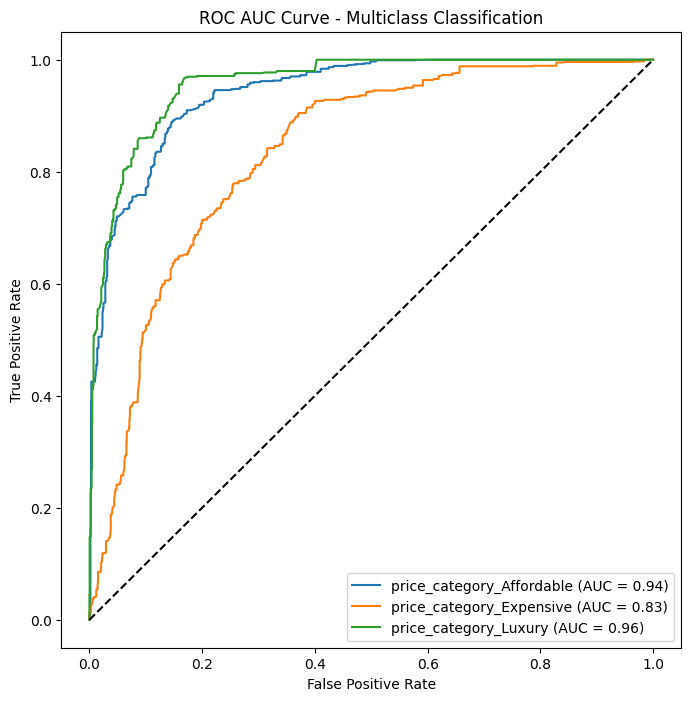

In [15]:
# Get the encoded target variable
y_encoded = df_encoded[['price_category_Affordable', 'price_category_Expensive', 'price_category_Luxury']]

# Binarize the target variable
y_binary = y_encoded.to_numpy()

# Compute predicted probabilities
y_pred_proba = logistic_model.predict_proba(X)

# Compute ROC curve and ROC AUC for each class
fpr = dict()
tpr = dict()
roc_auc = dict()
for i in range(y_binary.shape[1]):
    fpr[i], tpr[i], _ = roc_curve(y_binary[:, i], y_pred_proba[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])

# Define class names
class_names = label_encoder.classes_

# Plot ROC curve for each class
plt.figure(figsize=(8, 8))
for i in range(y_binary.shape[1]):
    plt.plot(fpr[i], tpr[i], label=f'{class_names[i]} (AUC = {roc_auc[i]:.2f})')

# Plot the diagonal line (random classifier)
plt.plot([0, 1], [0, 1], 'k--')

# Set plot labels and title
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC AUC Curve - Multiclass Classification')

# Add legend
plt.legend(loc='lower right')

# Show the plot
plt.show()

The AUC represents the overall performance of the model in distinguishing positive instances from negative instances. A higher AUC indicates better discrimination ability and classification performance.

Based on the AUC values obtained, we can conclude that the model performs relatively well for all three categories. The Affordable and Luxury categories have higher AUC values (0.94 and 0.96, respectively), indicating strong discrimination and good predictive accuracy. The Expensive category has a slightly lower AUC value (0.83), suggesting relatively lower discrimination ability compared to the other two categories.

In summary, the model shows good discriminative power in predicting the Affordable and Luxury categories, while it performs slightly less accurately for the Expensive category. Nonetheless, the overall performance of the model is promising, with AUC values ranging from 0.83 to 0.96 for the different price categories.

AdaBoost (Adaptive Boosting) is an ensemble learning method that combines multiple weak learners (typically decision trees) to create a strong classifier. It is an iterative algorithm that focuses on those instances in the dataset that are difficult to classify correctly. Each weak learner is trained on a modified version of the dataset, where the weights of the misclassified instances are increased in subsequent iterations.

In each iteration, AdaBoost adjusts the weights of the training instances based on their classification results, giving more weight to the misclassified instances. This allows the subsequent weak learners to focus more on the difficult instances and improve the overall performance of the ensemble. The final prediction is made by combining the predictions of all weak learners, typically through a weighted majority voting scheme.

AdaBoost is particularly effective in handling complex classification problems and can achieve high accuracy by combining multiple weak learners. It is known for its ability to handle class imbalance and outliers in the data. However, it is sensitive to noisy data and can be prone to overfitting if the weak learners are too complex or if the number of iterations is too high.

When evaluating the AdaBoost model, the accuracy score is a commonly used metric to assess the overall classification performance. The mean squared error (MSE) can be used as a measure of the error or mismatch between the predicted and actual class labels. However, it's important to note that MSE may not be the most suitable metric for evaluating classification models, as it is primarily used for regression tasks. Other evaluation metrics such as precision, recall, and F1 score may provide more insights into the model's performance.

In [16]:
# Ensemble Methods - AdaBoost
adaboost_model = AdaBoostClassifier(n_estimators=100)
adaboost_model.fit(X, y)

# Make predictions on the training set
y_pred = adaboost_model.predict(X)

# Calculate accuracy score
accuracy = accuracy_score(y, y_pred)

# Calculate mean squared error (MSE)
mse = mean_squared_error(y, y_pred)

# Print the accuracy score and MSE
print("Accuracy Score:", accuracy)
print("Mean Squared Error (MSE):", mse)

Accuracy Score: 0.7846925972396487
Mean Squared Error (MSE): 0.21606022584692597


The confusion matrix is a useful tool for evaluating the performance of a classification model. It provides a tabular representation of the model's predictions compared to the actual class labels. Each row in the confusion matrix represents the instances in the actual class, while each column represents the instances in the predicted class.

In the case of AdaBoost, the confusion matrix helps us understand how well the model is predicting the different classes in the dataset. The values in the cells of the confusion matrix indicate the number of instances that were classified into a particular combination of actual and predicted classes.

The confusion matrix plot generated above visualizes the confusion matrix for the AdaBoost model. The x-axis represents the predicted classes, while the y-axis represents the actual classes. The color of each cell in the plot indicates the count of instances for that combination of actual and predicted classes. The darker the color, the higher the count.

By examining the confusion matrix, we can gain insights into the model's performance. We can observe which classes are being correctly predicted and which classes are being confused with others. This information can help identify any patterns or areas where the model might be struggling.

In [17]:
# Confusion Matrix
confusion = confusion_matrix(y, y_pred)

# Convert confusion matrix to DataFrame
confusion_df = pd.DataFrame(confusion, columns=class_names, index=class_names)
confusion_df = confusion_df.reset_index().melt('index', var_name='predicted', value_name='count')
confusion_df = confusion_df.rename(columns={'index': 'actual'})

# Plot Confusion Matrix
chart = alt.Chart(confusion_df, title='Confusion Matrix').mark_rect().encode(
    alt.X('predicted:O', title='Predicted', axis=alt.Axis(labelAngle= 0, labelFontSize=14, labelColor='white')),
    alt.Y('actual:O', title='Actual', axis=alt.Axis(labelAngle= -90, labelFontSize=14, labelColor='white')),
    alt.Color('count:Q', title='Count', scale=alt.Scale(scheme='plasma'), legend=alt.Legend(gradientThickness=75, gradientLength=550, padding=50, labelFontSize=14, labelColor='white', titleFontSize=14, titleColor='white')),
    tooltip=['actual', 'predicted', 'count'],
).properties(
    width=700,
    height=700,
    title=alt.TitleParams(text='Confusion Matrix', color='white'),
)

text = chart.mark_text(baseline='middle', fontSize=22).encode(
    text=alt.Text('count:Q'),
    color=alt.value('black')
    )

(chart+text).configure(background='transparent').display()

alt.LayerChart(...)

Based on the confusion matrix the model performs well in correctly predicting the "Affordable" and "Luxury" classes. The majority of samples in these classes are classified correctly, resulting in high true positive counts (2,012 for "Affordable" and 589 for "Luxury").

However, the model struggles more with the "Expensive" class. It has a relatively higher number of false positives (203) and false negatives (271) for this class, indicating that some samples from other classes are misclassified as "Expensive" and vice versa.

Overall, the model's accuracy and performance may vary across different price categories. It demonstrates higher accuracy for "Affordable" and "Luxury" classes but shows room for improvement in accurately predicting the "Expensive" class.

It's important to consider these results when comparing the performance of different models and identifying areas for improvement in classification accuracy.

Now we have several classification models, which we are going to compare briefly.

* Random Forests: Random Forests is an ensemble learning method that combines multiple decision trees. Each tree is trained on a random subset of the data, and the final prediction is made by averaging the predictions of all trees. Random Forests are known for their ability to handle high-dimensional data, handle missing values, and avoid overfitting.

* K-nearest Neighbors (KNN): K-nearest Neighbors is a non-parametric classification algorithm that classifies new data points based on the majority class of its k nearest neighbors in the feature space. The value of k determines the number of neighbors considered. KNN is simple to implement and can handle complex decision boundaries.

* Decision Tree: Decision Tree is a tree-based classification algorithm that splits the data based on feature values to create a tree-like model of decisions. It partitions the feature space into regions, and each leaf node represents a class label. Decision Trees are interpretable, easy to understand, and can handle both categorical and numerical data.

* Gradient Boosting: Gradient Boosting is an ensemble learning method that combines multiple weak models (typically decision trees) in a sequential manner. It trains each subsequent model to correct the mistakes made by the previous model. Gradient Boosting is known for its high predictive power and ability to handle complex relationships in the data.

* Support Vector Machine (SVM): Support Vector Machine is a supervised learning algorithm that finds an optimal hyperplane to separate the data into different classes. It works by mapping the data into a higher-dimensional feature space and finding the best separating hyperplane. SVMs are effective for both linear and non-linear classification tasks and can handle high-dimensional data.

Each of these models has its strengths and weaknesses, and the choice of the best model depends on the specific characteristics of the data and the problem at hand. By comparing their accuracy scores and mean squared errors, you can assess their performance and determine which model performs better for your classification task.

In [18]:
# Ensemble Methods - Random Forests
random_forest_model = RandomForestClassifier(n_estimators=100)
random_forest_model.fit(X, y)

# K-nearest Neighbors
knn_model = KNeighborsClassifier(n_neighbors=5)
knn_model.fit(X, y)

# Decision Tree
decision_tree_model = DecisionTreeClassifier()
decision_tree_model.fit(X, y)

# Gradient Boosting
gradient_boosting_model = GradientBoostingClassifier(n_estimators=100)
gradient_boosting_model.fit(X, y)

# Support Vector Machine
svm_model = SVC()
svm_model.fit(X, y)

# Accuracy scores and MSE for Random Forests
y_pred_rf = random_forest_model.predict(X)
accuracy_rf = accuracy_score(y, y_pred_rf)
mse_rf = mean_squared_error(y, y_pred_rf)

# Accuracy scores and MSE for K-nearest Neighbors
y_pred_knn = knn_model.predict(X)
accuracy_knn = accuracy_score(y, y_pred_knn)
mse_knn = mean_squared_error(y, y_pred_knn)

# Accuracy scores and MSE for Decision Tree
y_pred_dt = decision_tree_model.predict(X)
accuracy_dt = accuracy_score(y, y_pred_dt)
mse_dt = mean_squared_error(y, y_pred_dt)

# Accuracy scores and MSE for Gradient Boosting
y_pred_gb = gradient_boosting_model.predict(X)
accuracy_gb = accuracy_score(y, y_pred_gb)
mse_gb = mean_squared_error(y, y_pred_gb)

# Accuracy scores and MSE for Support Vector Machine
y_pred_svm = svm_model.predict(X)
accuracy_svm = accuracy_score(y, y_pred_svm)
mse_svm = mean_squared_error(y, y_pred_svm)

# Print the accuracy scores and MSEs for each model
print("Random Forests - Accuracy Score:", accuracy_rf)
print("Random Forests - Mean Squared Error (MSE):", mse_rf)
print("K-nearest Neighbors - Accuracy Score:", accuracy_knn)
print("K-nearest Neighbors - Mean Squared Error (MSE):", mse_knn)
print("Decision Tree - Accuracy Score:", accuracy_dt)
print("Decision Tree - Mean Squared Error (MSE):", mse_dt)
print("Gradient Boosting - Accuracy Score:", accuracy_gb)
print("Gradient Boosting - Mean Squared Error (MSE):", mse_gb)
print("Support Vector Machine - Accuracy Score:", accuracy_svm)
print("Support Vector Machine - Mean Squared Error (MSE):", mse_svm)

Random Forests - Accuracy Score: 0.9335006273525721
Random Forests - Mean Squared Error (MSE): 0.06649937264742785
K-nearest Neighbors - Accuracy Score: 0.9156838143036387
K-nearest Neighbors - Mean Squared Error (MSE): 0.08657465495608532
Decision Tree - Accuracy Score: 0.9337515683814304
Decision Tree - Mean Squared Error (MSE): 0.06624843161856964
Gradient Boosting - Accuracy Score: 0.9001254705144291
Gradient Boosting - Mean Squared Error (MSE): 0.1013801756587202
Support Vector Machine - Accuracy Score: 0.8020075282308657
Support Vector Machine - Mean Squared Error (MSE): 0.19949811794228356


Random Forests: Achieved a high accuracy score of 0.934 and a low MSE of 0.066. It demonstrates strong performance in accurately classifying the car price categories.

K-nearest Neighbors: Showed a slightly lower accuracy score of 0.916 and a higher MSE of 0.087. It performs reasonably well but has a slightly higher error rate compared to Random Forests.

Decision Tree: Obtained the same accuracy score as Random Forests at 0.934 and a matching MSE of 0.066. It showcases similar performance to Random Forests, suggesting that a single decision tree model can achieve comparable results.

Gradient Boosting: Achieved a lower accuracy score of 0.900 and a higher MSE of 0.101. It performs relatively worse compared to Random Forests and Decision Tree models, indicating potential areas for improvement.

Support Vector Machine: Demonstrated the lowest accuracy score of 0.802 and a relatively high MSE of 0.199. It exhibits lower performance compared to the other models, suggesting the need for further tuning or exploring alternative approaches.

In summary, Random Forests and Decision Tree models appear to perform the best among the evaluated models, with higher accuracy scores and lower MSE values. K-nearest Neighbors model follows closely but with a slightly higher error rate. Gradient Boosting and Support Vector Machine models have room for improvement in terms of accuracy and error metrics.

In [19]:
# Evaluate the models and compare their accuracy scores
models = [
    logistic_model,
    adaboost_model,
    random_forest_model,
    knn_model,
    decision_tree_model,
    gradient_boosting_model,
    svm_model
]

model_names = [
    'Logistic Regression',
    'AdaBoost',
    'Random Forests',
    'K-nearest Neighbors',
    'Decision Tree',
    'Gradient Boosting',
    'Support Vector Machine'
]

accuracies = []

for model, name in zip(models, model_names):
    accuracy = model.score(X, y)
    accuracies.append(accuracy)
    print(f'{name}: {accuracy}')

# Find the best and worst accuracy scores
best_model_idx = np.argmax(accuracies)
best_model_name = model_names[best_model_idx]
best_model_accuracy = accuracies[best_model_idx]

worst_model_idx = np.argmin(accuracies)
worst_model_name = model_names[worst_model_idx]
worst_model_accuracy = accuracies[worst_model_idx]

print(f'The model with the best accuracy score is {best_model_name} with an accuracy of {best_model_accuracy:.4f}.')
print(f'The model with the worst accuracy score is {worst_model_name} with an accuracy of {worst_model_accuracy:.4f}.')

Logistic Regression: 0.7897114178168131
AdaBoost: 0.7846925972396487
Random Forests: 0.9335006273525721
K-nearest Neighbors: 0.9156838143036387
Decision Tree: 0.9337515683814304
Gradient Boosting: 0.9001254705144291
Support Vector Machine: 0.8020075282308657
The model with the best accuracy score is Decision Tree with an accuracy of 0.9338.
The model with the worst accuracy score is AdaBoost with an accuracy of 0.7847.


The GridSearchCV object performs a cross-validated grid search to find the best combination of parameters. The cv parameter specifies the number of cross-validation folds.

After the grid search is completed, you can access the best model with the tuned parameters using grid_search.best_estimator_. Finally, you can print the best parameters and the corresponding accuracy score obtained from the grid search.

In [20]:
# Define the parameter grid for the SVM model
param_grid = {
    'C': [0.1, 1.0, 10.0],
    'kernel': ['linear', 'rbf'],
    'gamma': [0.1, 1.0, 10.0]
}

# Create the GridSearchCV object with the SVM model and parameter grid
grid_search = GridSearchCV(svm_model, param_grid, cv=5)

# Perform the grid search to find the best parameters
grid_search.fit(X, y)

# Get the best SVM model with the tuned parameters
best_svm_model = grid_search.best_estimator_

# Print the best parameters and its accuracy score
print("Best Parameters:", grid_search.best_params_)
print("Best Accuracy Score:", grid_search.best_score_)

Best Parameters: {'C': 10.0, 'gamma': 0.1, 'kernel': 'rbf'}
Best Accuracy Score: 0.8777917189460478


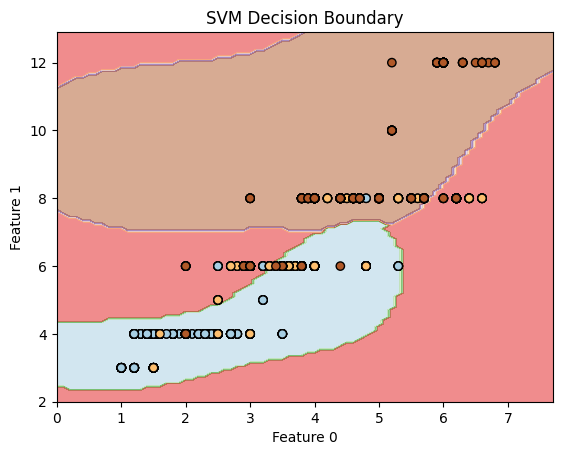

In [21]:
# Select two features for visualization (replace feature_indices with the desired indices)
feature_indices = [0, 1]
X_plot = X.iloc[:, feature_indices]

# Fit the SVM model with the best parameters
best_svm_model.fit(X_plot, y)

# Define the range for the plot
x_min, x_max = X_plot.iloc[:, 0].min() - 1, X_plot.iloc[:, 0].max() + 1
y_min, y_max = X_plot.iloc[:, 1].min() - 1, X_plot.iloc[:, 1].max() + 1
xx, yy = np.meshgrid(np.arange(x_min, x_max, 0.1), np.arange(y_min, y_max, 0.1))

# Predict the class labels for the meshgrid points
Z = best_svm_model.predict(np.c_[xx.ravel(), yy.ravel()])
Z = Z.reshape(xx.shape)

# Create a contour plot of the decision boundary
plt.contourf(xx, yy, Z, alpha=0.5, cmap=plt.cm.Paired)

# Scatter plot the data points
plt.scatter(X_plot.iloc[:, 0], X_plot.iloc[:, 1], c=y, cmap=plt.cm.Paired, edgecolors='k')

# Set plot labels and title
plt.xlabel('Feature {}'.format(feature_indices[0]))
plt.ylabel('Feature {}'.format(feature_indices[1]))
plt.title('SVM Decision Boundary')

# Show the plot
plt.show()

# Summary

In this project, our primary focus was on predicting the price of a product and classifying it into specific categories. We approached the problem using regression and classification techniques, respectively, and performed a comprehensive analysis from start to finish.

The journey began with data wrangling, where we cleaned and prepared the dataset for analysis. We handled missing values, performed data transformations, and ensured the data was in the appropriate format. This step was crucial in ensuring the accuracy and reliability of our predictive models.

Next, we delved into exploratory analysis to gain insights into the dataset. We conducted descriptive statistics, visualizations, and correlation analysis to understand the relationships between variables and identify key patterns or trends. This exploration provided valuable information about the dataset's characteristics and helped us make informed decisions during feature engineering.

Feature engineering played a pivotal role in capturing meaningful information for predicting the price. We selected relevant features, engineered new ones, and transformed variables to enhance the models' predictive capabilities. These engineered features aimed to capture the inherent characteristics of the data and improve the models' performance.

For the regression task of predicting the price, we employed various techniques such as linear regression, polynomial regression, and multilinear regression. Linear regression allowed us to model the relationship between the independent variables and the target variable using linear equations. Polynomial regression expanded on this by incorporating polynomial terms to capture non-linear patterns. Multilinear regression extended the approach to handle multiple independent variables simultaneously. We evaluated the regression models using metrics like mean squared error (MSE) and R-squared to assess their accuracy and fit.

On the other hand, for the classification task of categorizing the products, we utilized logistic regression as our primary classification technique. Logistic regression allowed us to predict the probability of a product falling into a specific category. We encoded the target variable and evaluated the classification model using accuracy score to measure its performance.

To further enhance our predictive models, we explored ensemble methods such as AdaBoost, random forests, K-nearest neighbors, decision trees, gradient boosting, and support vector machines. These ensemble techniques combined multiple models to improve predictive accuracy and generalization.

We also utilized evaluation metrics specific to classification tasks, such as the ROC AUC curve, to assess the models' performance in categorizing products. This curve provided insights into the models' ability to differentiate between different categories and aided in comparing their performance.

Throughout the project, we conducted hyperparameter tuning using techniques like grid search to optimize the models. This involved systematically searching for the best combination of hyperparameters to maximize the models' performance.

In summary, this project focused on predicting product prices using regression techniques and categorizing products into specific categories using classification techniques. Through data exploration, feature engineering, model selection, and evaluation, we aimed to build accurate and robust predictive models. The combination of regression and classification techniques, along with various evaluation metrics, enabled us to gain valuable insights and make informed decisions in predicting prices and classifying product categories.

# Discussion part

Introduction:
Working on this project was an intriguing experience, despite not being a car enthusiast. The journey began with the challenge of finding a suitable dataset. Although I had a background in machine learning, certain aspects presented challenges along the way. However, with determination and the utilization of various techniques, the project gradually unfolded.

Dataset Exploration and Wrangling:
The initial hurdle was to locate an appropriate dataset, which consumed a significant amount of time. Once the car dataset was obtained, the wrangling process commenced. This involved cleaning the data, handling missing values, and preparing it for analysis. As I delved deeper into this process, I realized the need to create a comprehensive notebook, including not only simple price prediction but also various functions from the course.

Feature Engineering and Visualization:
To enhance the predictive power of the models, feature engineering played a crucial role. This step involved selecting relevant features, engineering new ones, and transforming variables to capture the essence of the data. Additionally, I wanted to incorporate visualizations using the Altair library, which posed a challenge initially. However, with perseverance, I managed to overcome this hurdle and successfully integrate visualizations into the project.

Regression Analysis:
Moving forward, the focus shifted to predicting car prices. By employing regression techniques such as linear, polynomial, and multilinear regression, I aimed to model the relationships between independent variables and the target variable. This involved evaluating the models using metrics like mean squared error (MSE) and R-squared to assess their accuracy and fit.

Classification Analysis:
Another aspect of the project involved classifying the cars into specific categories. Utilizing logistic regression as the primary classification technique, I aimed to predict the probability of a car belonging to a particular category. The classification models were evaluated using accuracy scores and the ROC AUC curve to measure their performance.

Model Comparison and Analysis:
In order to compare the different models, I ventured into ensemble methods such as AdaBoost, random forests, K-nearest neighbors, decision trees, gradient boosting, and support vector machines. This allowed me to evaluate their predictive accuracy and generalization capabilities. Hyperparameter tuning, employing techniques like grid search, was performed to optimize the models and achieve optimal performance.

Conclusion:
Overall, this project involved navigating through the intricacies of a car dataset, conducting thorough wrangling, exploring various regression and classification techniques, and comparing their performances. It was not only a chance to showcase my machine learning skills but also a valuable opportunity for personal growth and knowledge reinforcement. Dividing the work into two notebooks, one for wrangling and the other for model experimentation, ensured a comprehensive analysis of the dataset. Ultimately, this project served as a reminder of the significance of dataset selection, meticulous analysis, and the rewards of overcoming challenges in the pursuit of accurate predictions and meaningful insights.